# 제주도 재난지원금 지원 전후 소비 분석


### 제주도 재난지원금지원 이전의 읍면동별 카드 소비 분석
<사용한 외부 데이터>
- https://www.data.go.kr/data/15074768/fileData.do(카드20~4월까지)
- https://www.data.go.kr/data/15074778/fileData.do(유동인구 비율 대비 지역별 인기있는 업종 추천)

In [25]:
# 필요라이브러리 가져오기
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import folium
from folium import plugins
from folium.plugins import MousePosition
from pyproj import Proj, Transformer 
import json

In [54]:
# 한글 깨짐 방지
import matplotlib
from matplotlib import font_manager, rc
import platform
if platform.system()=="Windows":
    font_name=font_manager.FontProperties(fname="c:/Windows/Fonts/malgun.ttf").get_name()
    rc('font', family=font_name)
matplotlib.rcParams['axes.unicode_minus']=False

import warnings
warnings.filterwarnings("ignore")

### 1. 제주도 재난지원금 데이터 이전의 읍면동별 카드 소비 분석
- 재난지원금의 데이터는 20년 5-8월, 그래서 그 전인 20년 1-4월로 카드결제 금액으로 소비 분석

In [45]:
# 카드 데이터 가져오기
card = pd.read_csv('data/jeju_place.csv',encoding='ansi')
card.head()

,년월,시도명,읍면동명,업종명,성별,이용자수,이용금액,거주인구,근무인구,방문인구,데이터기준일자
0,2017-01,서귀포시,남원읍,건강보조식품 소매업,남성,11,137500,4365500.518,380992.059,2844836.615,2020-12-15
1,2017-01,서귀포시,남원읍,골프장 운영업,남성,1988,285901584,4365500.518,380992.059,2844836.615,2020-12-15
2,2017-01,서귀포시,남원읍,과실 및 채소 소매업,남성,685,49486002,4365500.518,380992.059,2844836.615,2020-12-15
3,2017-01,서귀포시,남원읍,관광 민예품 및 선물용품 소매업,남성,6,116000,4365500.518,380992.059,2844836.615,2020-12-15
4,2017-01,서귀포시,남원읍,그외 기타 종합 소매업,남성,1,100000,4365500.518,380992.059,2844836.615,2020-12-15


In [46]:
#17년도부터 있기때문에 20년도 1~4월만 남겨놓고 모두 제거
card = card[card['년월'].str.contains('2020')]
card.head()

,년월,시도명,읍면동명,업종명,성별,이용자수,이용금액,거주인구,근무인구,방문인구,데이터기준일자
81567,2020-01,서귀포시,남원읍,건강보조식품 소매업,남성,2,65000,4869067.386,444319.725,3304302.997,2020-12-15
81568,2020-01,서귀포시,남원읍,골프장 운영업,남성,1980,297727940,4869067.386,444319.725,3304302.997,2020-12-15
81569,2020-01,서귀포시,남원읍,과실 및 채소 소매업,남성,1429,59655253,4869067.386,444319.725,3304302.997,2020-12-15
81570,2020-01,서귀포시,남원읍,관광 민예품 및 선물용품 소매업,남성,74,1730000,4869067.386,444319.725,3304302.997,2020-12-15
81571,2020-01,서귀포시,남원읍,그외 기타 종합 소매업,남성,1,100000,4869067.386,444319.725,3304302.997,2020-12-15


In [49]:
#월별 소비분석
price = card.groupby(['년월']).sum().이용금액

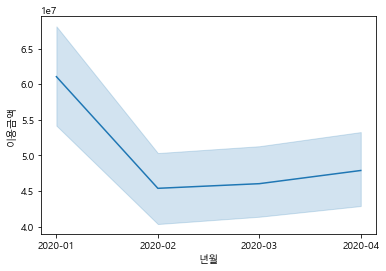

In [55]:
sns.lineplot(y='이용금액',x='년월',data=card)

### 코로나가 시작 될 시점에 낮아졌다가 조금씩 증가한 것으로 보임.

(array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9]),
 <a list of 10 Text major ticklabel objects>)

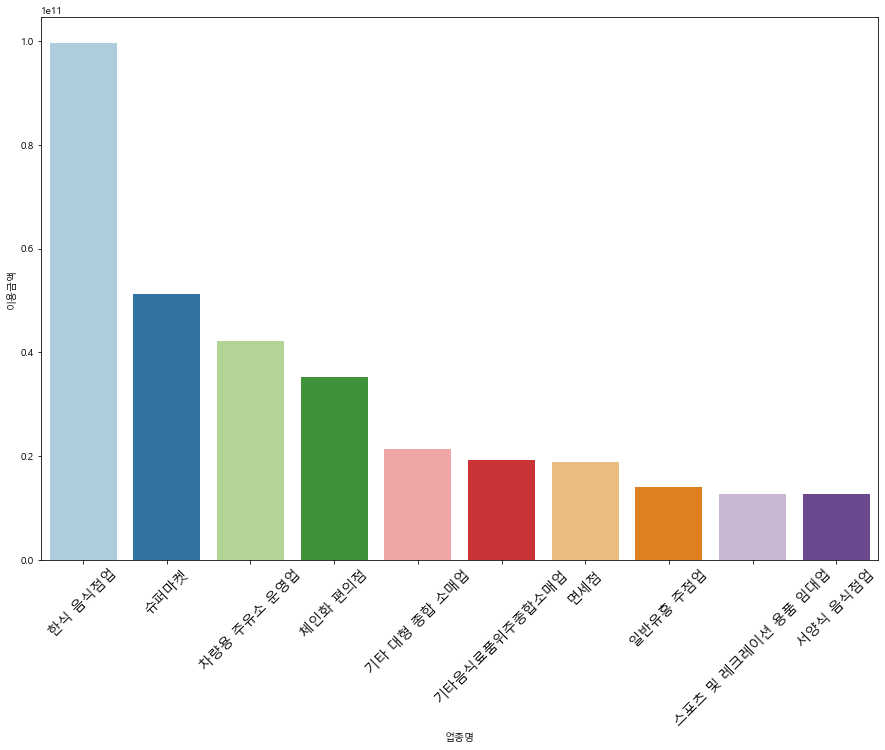

In [364]:
plt.figure(figsize=(15,10))
sns.barplot(y="이용금액", x="업종명", palette='Paired'
            ,data=card.groupby('업종명').sum().이용금액.to_frame().reset_index().sort_values(by='이용금액',ascending=False)[:10])
plt.xticks(rotation=45,size=14)

### 관광지 특성상 음식점이 많이 나올 수 있음, 아직 코로나 초기라서 그런지 면세점도 낮은편이 아니라는 점을 볼 수 있다.

In [115]:
# 유동인구별, 이용금액 20년도 데이터만.
place = pd.read_csv('data/jeju_people.csv',encoding='ansi')
place = place[place['년월'].str.contains('2020')]
place.head()

,년월,시도명,읍면동명,업종명,이용자수,이용금액,총 유동인구,데이터기준일자
28310,2020-01,서귀포시,남원읍,건강보조식품 소매업,10,1475000,16801997.61,2020-12-15
28311,2020-01,서귀포시,남원읍,골프장 운영업,3929,727062477,16801997.61,2020-12-15
28312,2020-01,서귀포시,남원읍,과실 및 채소 소매업,3313,159828593,16801997.61,2020-12-15
28313,2020-01,서귀포시,남원읍,관광 민예품 및 선물용품 소매업,366,6843000,16801997.61,2020-12-15
28314,2020-01,서귀포시,남원읍,그외 기타 종합 소매업,12,5210000,16801997.61,2020-12-15


- 읍면동별 이용금액 

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35, 36, 37, 38, 39, 40, 41, 42]),
 <a list of 43 Text major ticklabel objects>)

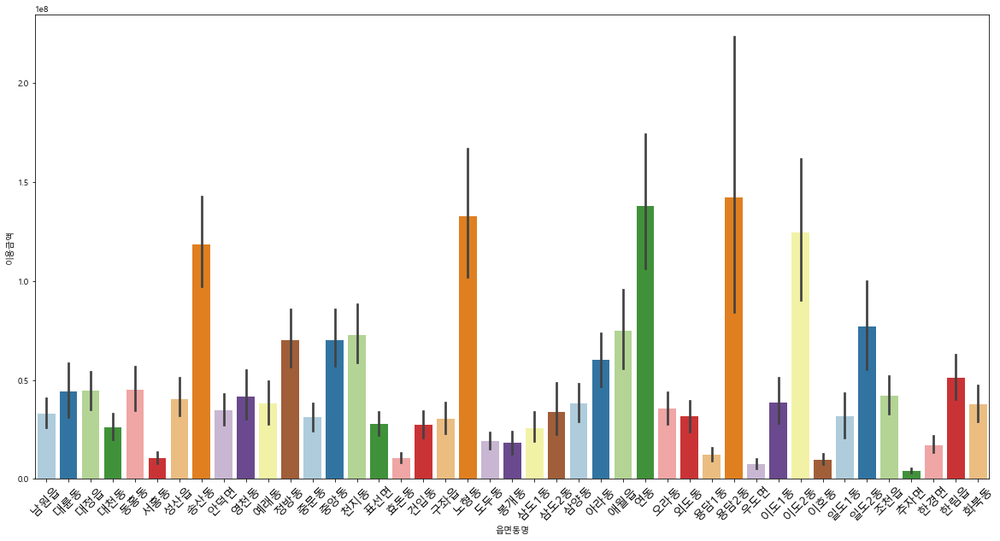

In [118]:
plt.figure(figsize=(20,10))
sns.barplot(y="이용금액", x="읍면동명", palette='Paired', data=card)
plt.xticks(rotation=45,size=14)

### 유동인구가 많은지역에 소비금액이 클까..?

- 유동인구가 많은지역

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35, 36, 37, 38, 39, 40, 41, 42]),
 <a list of 43 Text major ticklabel objects>)

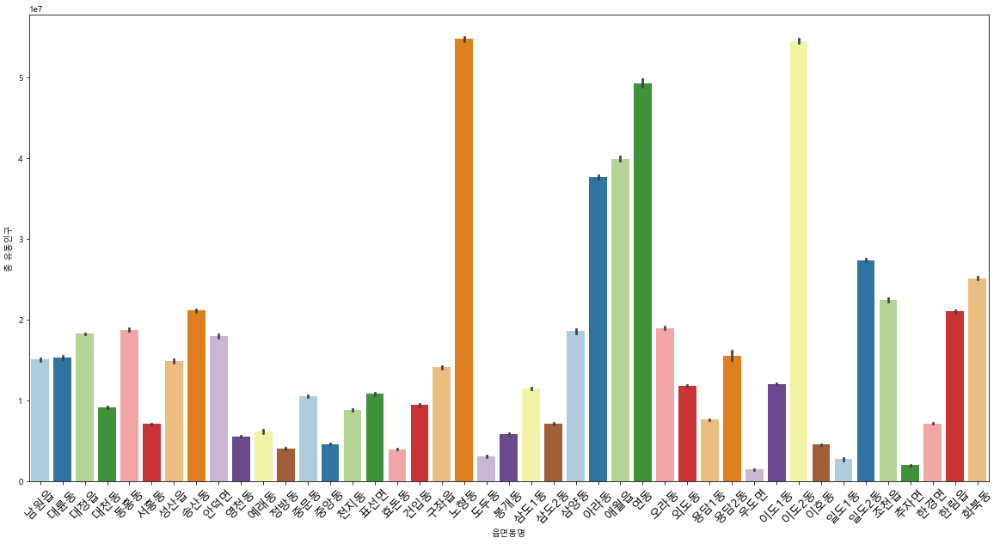

In [391]:
plt.figure(figsize=(20,10))
sns.barplot(y="총 유동인구", x="읍면동명", palette='Paired', data=place)
plt.xticks(rotation=45,size=14)

- 유동인구 대비 소비금액

In [401]:
temp = place.groupby('읍면동명').sum()
temp['유동인구대비소비금액'] = temp['이용금액'] / temp['총 유동인구']
temp.reset_index().head()

,읍면동명,이용자수,이용금액,총 유동인구,유동인구대비소비금액
0,건입동,210074,8336112219,1.059961e+09,7.864546
1,구좌읍,249118,8499987560,1.554873e+09,5.466678
2,남원읍,232930,10446920083,1.690815e+09,6.178631
3,노형동,1401507,49623229156,7.442107e+09,6.667900
4,대륜동,305776,11935673521,1.658275e+09,7.197645


(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35, 36, 37, 38, 39, 40, 41, 42]),
 <a list of 43 Text major ticklabel objects>)

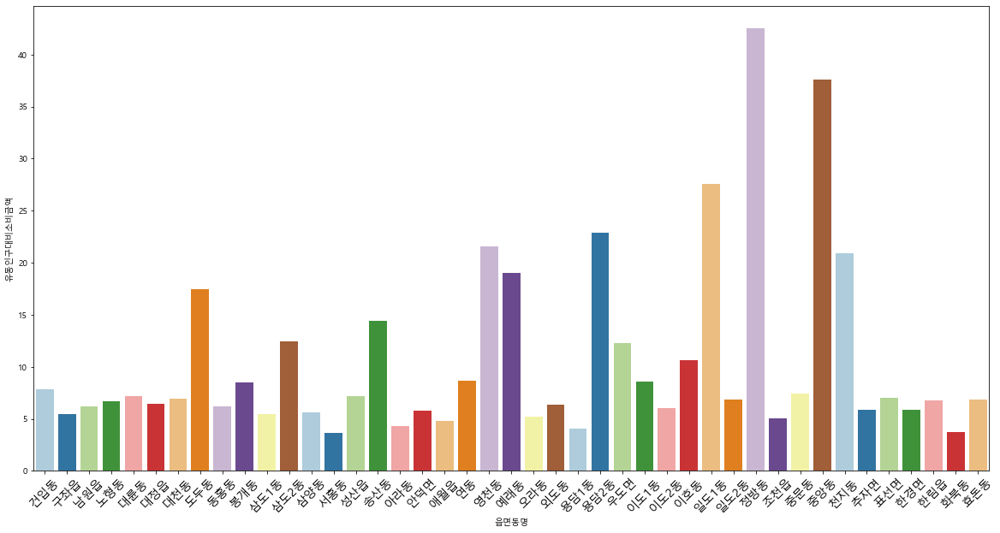

In [403]:
plt.figure(figsize=(20,10))
sns.barplot(y="유동인구대비소비금액", x=temp.index, palette='Paired', data=temp)
plt.xticks(rotation=45,size=14)

### 유동인구가 많다하여, 소비금액도 많다고 볼 수 없음.

### 1. 제주도 재난지원금 데이터  소비 분석
- 재난지원금의 데이터는 20년 5-8월의 데이터로 소비분석.

In [38]:
# 좌표 변경, 읍면동은 qgis로 좌표계 변경
# 파일은 proj사용, https://codingfactory.tistory.com/54 블로그 글 참고
df = pd.read_csv('data/Jeju_data8.txt')
df = df.drop(['OBJECTID','Field1'],axis=1)
df.head()

,YM,SIDO,SIGUNGU,FranClass,Type,Time,TotalSpent,DisSpent,NumofSpent,NumofDisSpent,POINT_X,POINT_Y
0,202008,제주특별자치도,제주시,영세,일반한식,00시,249500,0,7,0,877005.9834,1.479766e+06
1,202008,제주특별자치도,제주시,영세,단란주점,00시,2010000,0,7,0,877005.7447,1.479816e+06
2,202008,제주특별자치도,제주시,중소1,편의점,00시,401210,0,41,0,877056.6756,1.479616e+06
3,202008,제주특별자치도,제주시,영세,편의점,00시,12250,0,1,0,877055.9593,1.479766e+06
4,202008,제주특별자치도,제주시,영세,주점,00시,33000,0,1,0,877055.4817,1.479866e+06


In [39]:
transformer = Transformer.from_proj(Proj(init='epsg:5178'), Proj(init='epsg:4326'))
points = []
for index, item in df[['POINT_X', 'POINT_Y']].iterrows():
    points.append((item.POINT_X, item.POINT_Y))
    
latlist, lnglist = [], []
for pt in transformer.itransform(points):
    latlist.append(pt[1])
    lnglist.append(pt[0])
    
df['lat'] = latlist
df['lng'] = lnglist

C:\python\lib\site-packages\pyproj\crs\crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))
C:\python\lib\site-packages\pyproj\crs\crs.py:294: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  projstring = _prepare_from_string(" ".join((projstring, projkwargs)))
C:\python\lib\site-packages\pyproj\crs\crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.

In [40]:
df.head()

,YM,SIDO,SIGUNGU,FranClass,Type,Time,TotalSpent,DisSpent,NumofSpent,NumofDisSpent,POINT_X,POINT_Y,lat,lng
0,202008,제주특별자치도,제주시,영세,일반한식,00시,249500,0,7,0,877005.9834,1.479766e+06,33.305090,126.176746
1,202008,제주특별자치도,제주시,영세,단란주점,00시,2010000,0,7,0,877005.7447,1.479816e+06,33.305540,126.176737
2,202008,제주특별자치도,제주시,중소1,편의점,00시,401210,0,41,0,877056.6756,1.479616e+06,33.303746,126.177311
3,202008,제주특별자치도,제주시,영세,편의점,00시,12250,0,1,0,877055.9593,1.479766e+06,33.305098,126.177283
4,202008,제주특별자치도,제주시,영세,주점,00시,33000,0,1,0,877055.4817,1.479866e+06,33.305999,126.177264


In [41]:
df = df.drop(['POINT_X','POINT_Y'],axis=1)

In [42]:
df.to_csv('data/Jeju_data8.csv')

In [464]:
# 5~7 월 파일 합쳐주기
df1 = pd.read_csv('data/Jeju_data5.csv')
df2 = pd.read_csv('data/Jeju_data6.csv')
df3 = pd.read_csv('data/Jeju_data7.csv')
df4 = pd.read_csv('data/Jeju_data8.csv')

In [131]:
total = pd.concat([df1,df2,df3,df4])
total = total.drop(['X','Y','Unnamed: 0'],axis=1)
total.head()

,YM,SIDO,SIGUNGU,FranClass,Type,Time,TotalSpent,DisSpent,NumofSpent,NumofDisSpent,lat,lng
0,202005,제주특별자치도,제주시,영세,일반한식,00시,363000,66500,10,2,33.305090,126.176746
1,202005,제주특별자치도,제주시,영세,단란주점,00시,1180000,0,3,0,33.305540,126.176737
2,202005,제주특별자치도,제주시,중소1,편의점,00시,157670,6850,20,2,33.303746,126.177311
3,202005,제주특별자치도,제주시,영세,편의점,00시,46600,0,2,0,33.305098,126.177283
4,202005,제주특별자치도,제주시,영세,주점,00시,66000,0,2,0,33.305999,126.177264


In [146]:
total['YM']=total.YM.astype('str')

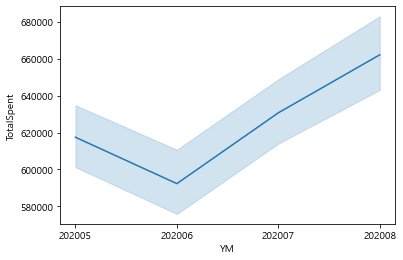

In [147]:
#  각월별 매출(재난지원금 포함)
sns.lineplot(y='TotalSpent',x='YM',data=total)

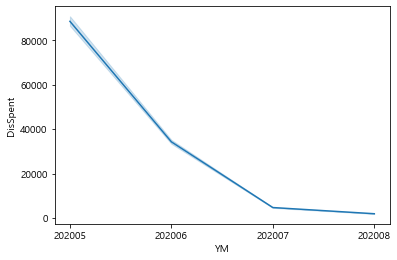

In [190]:
#  각월별 매출(재난지원금만)
sns.lineplot(y='DisSpent',x='YM',data=total)

### 사용금액은 점점 오르지만, 재난지원금은 초기에 사용이 많고, 점점 줄어드는 모습을 볼 수 있다.

- 재난지원금 달별 매출금액

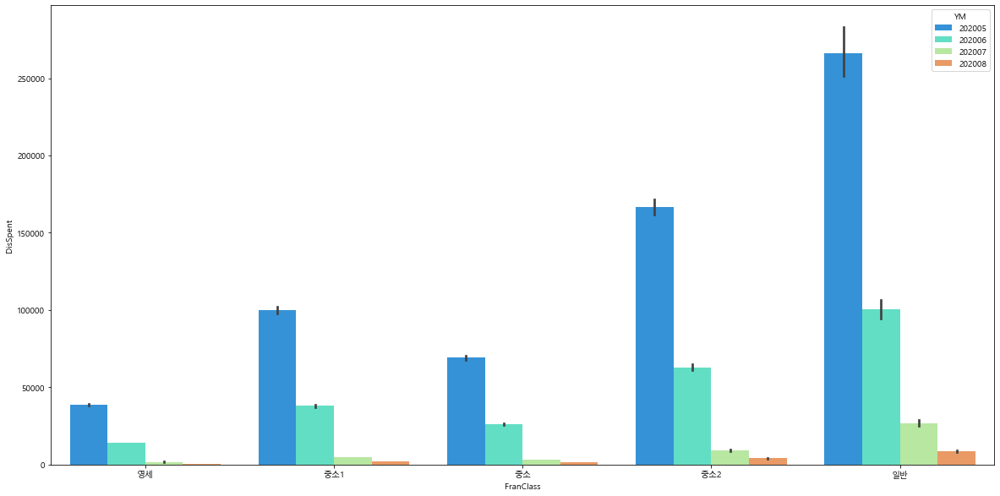

In [204]:
plt.figure(figsize=(20,10))
sns.barplot(y="DisSpent", x='FranClass', palette='rainbow', data=total,hue='YM')

- 재난지원금 시간대별 사용금액

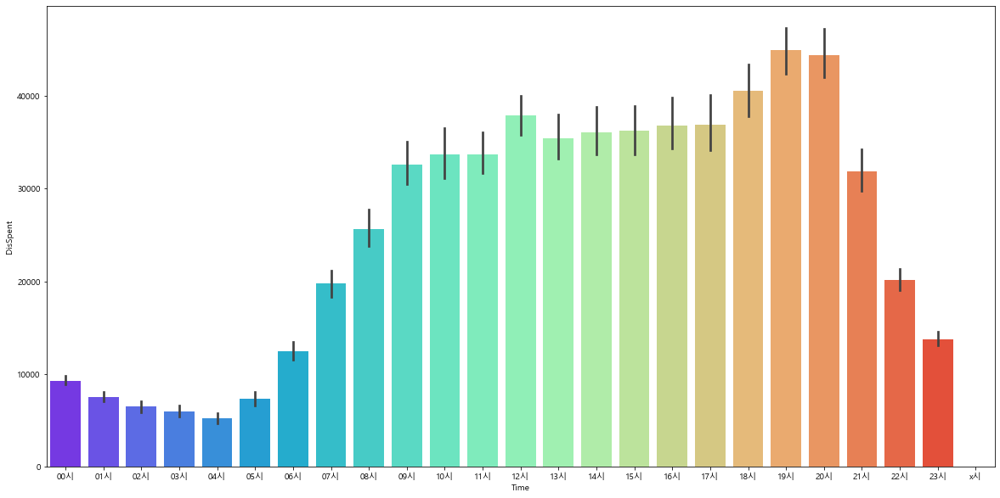

In [325]:
plt.figure(figsize=(20,10))
sns.barplot(y="DisSpent", x='Time', palette='rainbow', 
            data=total)

In [311]:
#총 결제 금액 대비 재난지원금 사용금액으로 재난지원금 금액.
# 재난지원금 사용금액 / 총 사용금액
total['per'] = total['DisSpent']/total['TotalSpent']
total.head(2)

,YM,SIDO,SIGUNGU,FranClass,Type,Time,TotalSpent,DisSpent,NumofSpent,NumofDisSpent,lat,lng,per
0,202005,제주특별자치도,제주시,영세,일반한식,00시,363000,66500,10,2,33.30509,126.176746,0.183196
1,202005,제주특별자치도,제주시,영세,단란주점,00시,1180000,0,3,0,33.30554,126.176737,0.000000


- 어느 지역에서 재난지원금을 가장 많이 사용했을까?

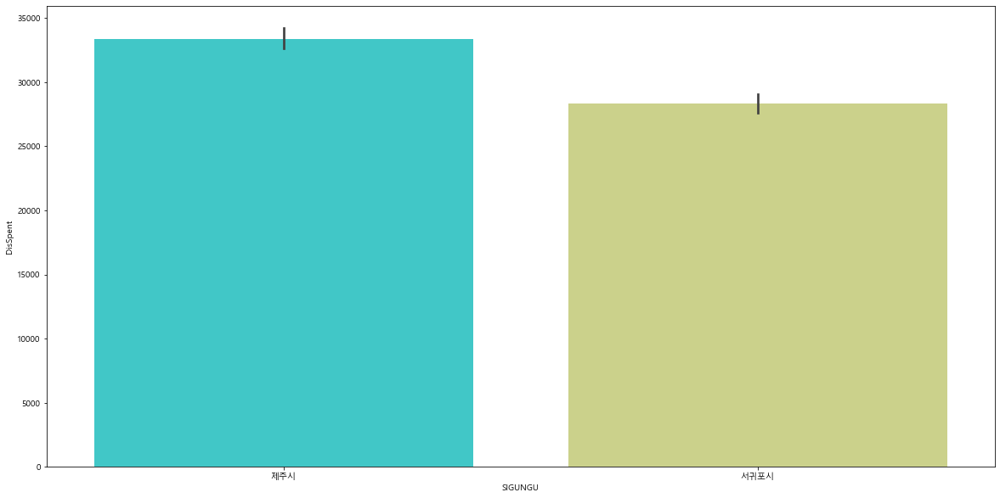

In [388]:
plt.figure(figsize=(20,10))
sns.barplot(y="DisSpent", x='SIGUNGU', palette='rainbow', data=total)

- 지역별 재난지원금 사용시간

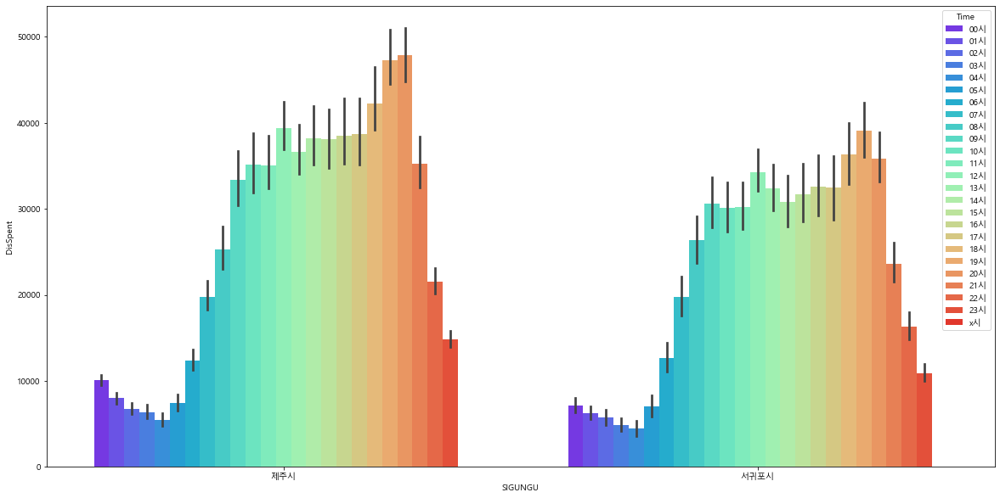

In [389]:
plt.figure(figsize=(20,10))
sns.barplot(y="DisSpent", x='SIGUNGU', palette='rainbow', data=total,hue = 'Time')

- 지역별 재난지원금 사용 대분류

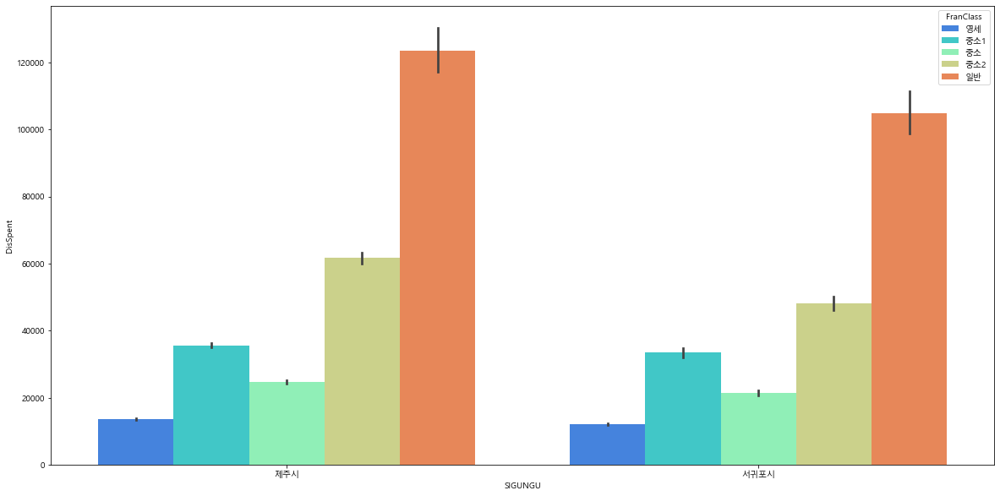

In [390]:
plt.figure(figsize=(20,10))
sns.barplot(y="DisSpent", x='SIGUNGU', palette='rainbow', data=total,hue = 'FranClass')

- 전체항목별 재난지원금 상위 10개 항목

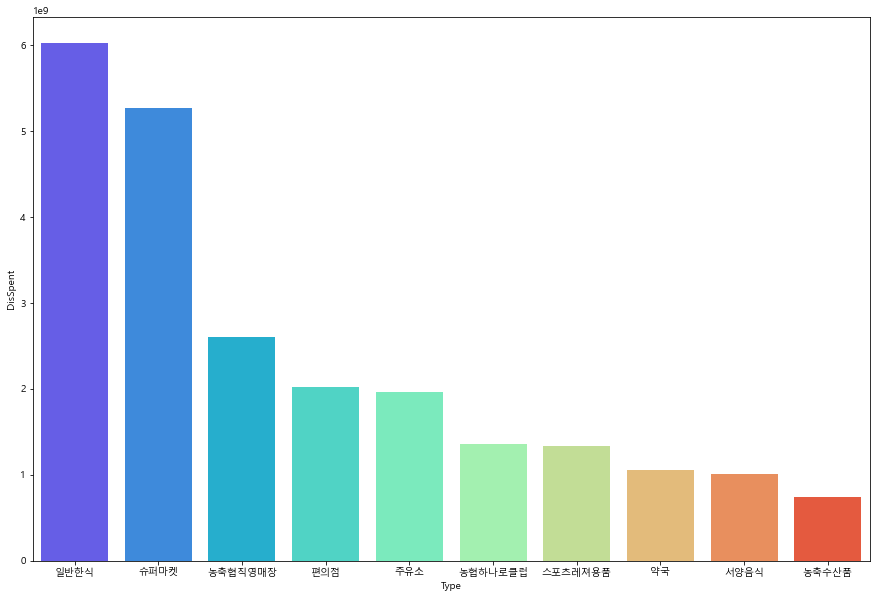

In [415]:
plt.figure(figsize=(15,10))
sns.barplot(y="DisSpent", x='Type', palette='rainbow'
            ,data=total.groupby('Type').sum().DisSpent.to_frame().reset_index().sort_values(by='DisSpent',ascending=False)[:10])

- 상위 10개 중 일반한식, 슈퍼마켓,농축협직영매장 시간대별 소비금액

In [420]:
hansik =  total[total['Type']=='일반한식']

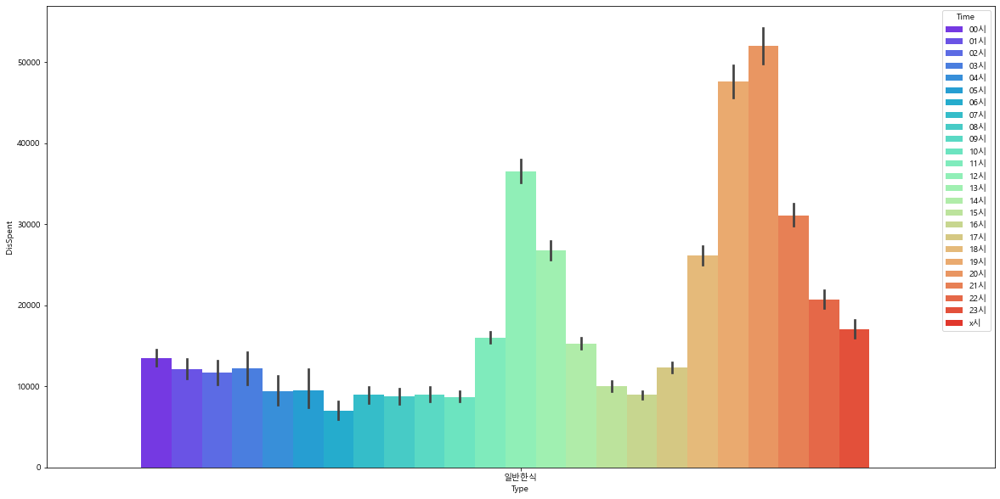

In [421]:
plt.figure(figsize=(20,10))
sns.barplot(y="DisSpent", x='Type', palette='rainbow',data=hansik,hue = 'Time')

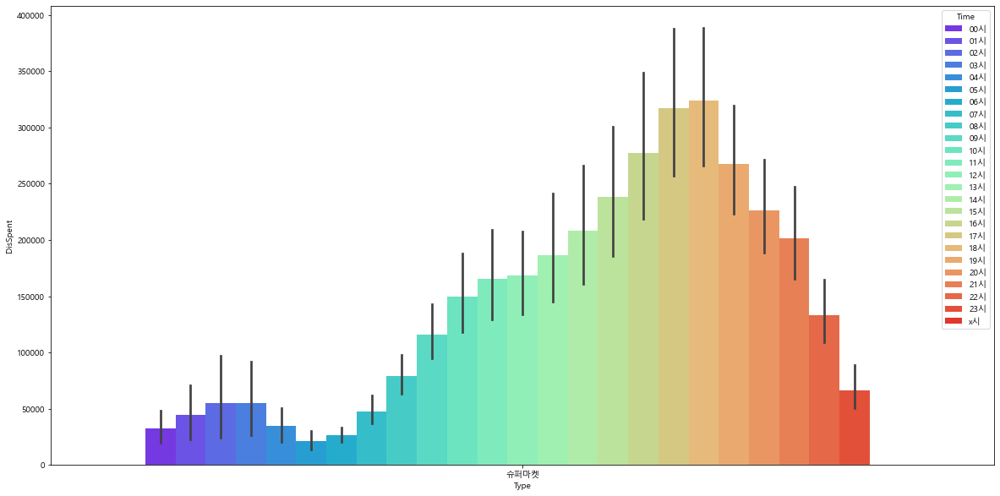

In [422]:
supermarket =  total[total['Type']=='슈퍼마켓']
plt.figure(figsize=(20,10))
sns.barplot(y="DisSpent", x='Type', palette='rainbow',data=supermarket,hue = 'Time')

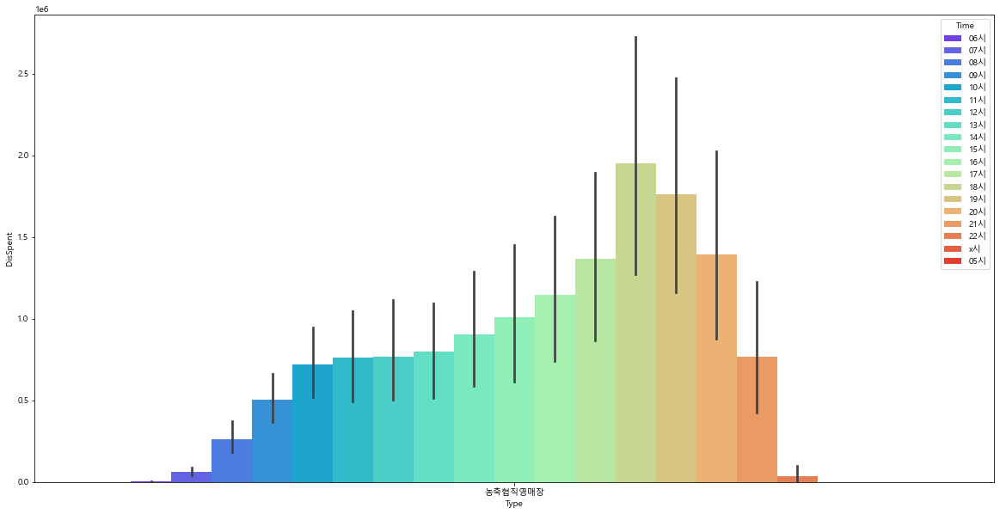

In [423]:
nong =  total[total['Type']=='농축협직영매장']
plt.figure(figsize=(20,10))
sns.barplot(y="DisSpent", x='Type', palette='rainbow',data=nong,hue = 'Time')

- 각 클래스별 재난지원금 상위 10개 항목

In [440]:
nor = total[total['FranClass'] =='일반']
nor.head()

,YM,SIDO,SIGUNGU,FranClass,Type,Time,TotalSpent,DisSpent,NumofSpent,NumofDisSpent,lat,lng,per
24,202005,제주특별자치도,제주시,일반,스넥,00시,137000,0,5,0,33.396580,126.238253,0.000000
60,202005,제주특별자치도,서귀포시,일반,일반한식,00시,269000,47000,5,1,33.223638,126.249230,0.174721
66,202005,제주특별자치도,서귀포시,일반,편의점,00시,217200,21850,22,4,33.230398,126.249096,0.100599
77,202005,제주특별자치도,서귀포시,일반,기타음료식품,00시,15100,0,4,0,33.224097,126.249758,0.000000
83,202005,제주특별자치도,서귀포시,일반,유흥주점,00시,170000,0,1,0,33.226350,126.249713,0.000000


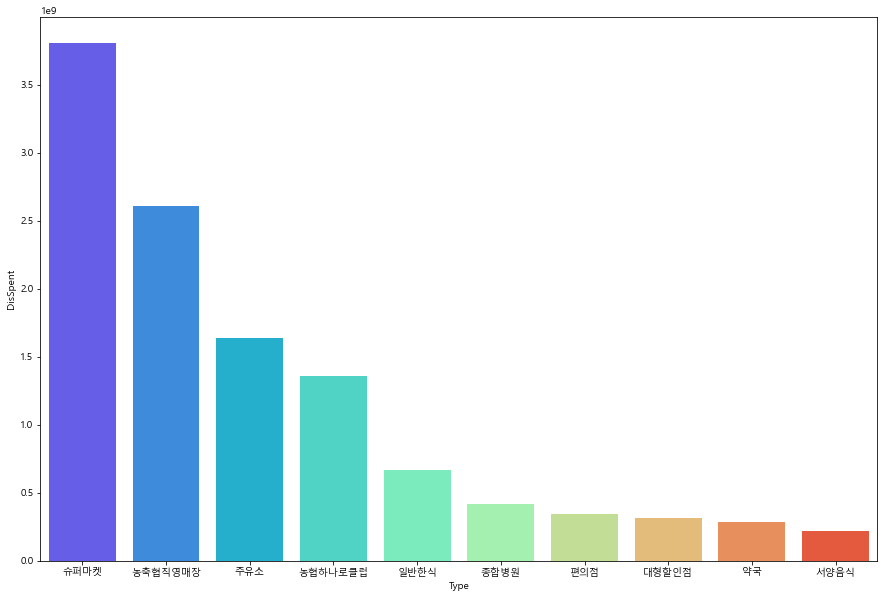

In [366]:
plt.figure(figsize=(15,10))
sns.barplot(y="DisSpent", x='Type', palette='rainbow'
            ,data=nor.groupby('Type').sum().DisSpent.to_frame().reset_index().sort_values(by='DisSpent',ascending=False)[:10])

In [367]:
small = total[total['FranClass'] =='영세']
small.head()

,YM,SIDO,SIGUNGU,FranClass,Type,Time,TotalSpent,DisSpent,NumofSpent,NumofDisSpent,lat,lng,per
0,202005,제주특별자치도,제주시,영세,일반한식,00시,363000,66500,10,2,33.305090,126.176746,0.183196
1,202005,제주특별자치도,제주시,영세,단란주점,00시,1180000,0,3,0,33.305540,126.176737,0.000000
3,202005,제주특별자치도,제주시,영세,편의점,00시,46600,0,2,0,33.305098,126.177283,0.000000
4,202005,제주특별자치도,제주시,영세,주점,00시,66000,0,2,0,33.305999,126.177264,0.000000
5,202005,제주특별자치도,제주시,영세,스넥,00시,159000,0,3,0,33.306022,126.178874,0.000000


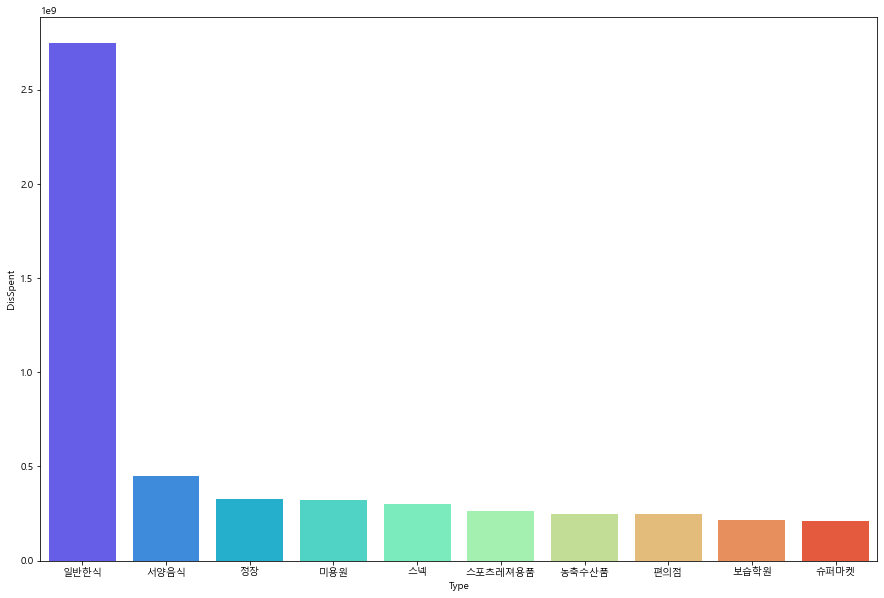

In [370]:
plt.figure(figsize=(15,10))
sns.barplot(y="DisSpent", x='Type', palette='rainbow'
            ,data=small.groupby('Type').sum().DisSpent.to_frame().reset_index().sort_values(by='DisSpent',ascending=False)[:10])

In [374]:
mid = total[total['FranClass'] =='중소']
mid.head()

,YM,SIDO,SIGUNGU,FranClass,Type,Time,TotalSpent,DisSpent,NumofSpent,NumofDisSpent,lat,lng,per
9,202005,제주특별자치도,서귀포시,중소,편의점,00시,21420,0,1,0,33.251303,126.197712,0.000000
16,202005,제주특별자치도,제주시,중소,편의점,00시,164330,41470,17,4,33.390569,126.227627,0.252358
31,202005,제주특별자치도,서귀포시,중소,편의점,00시,99720,5470,12,1,33.225831,126.244896,0.054854
44,202005,제주특별자치도,서귀포시,중소,스넥,00시,121000,17000,4,1,33.223623,126.248158,0.140496
53,202005,제주특별자치도,서귀포시,중소,편의점,00시,37100,0,2,0,33.218681,126.249329,0.000000


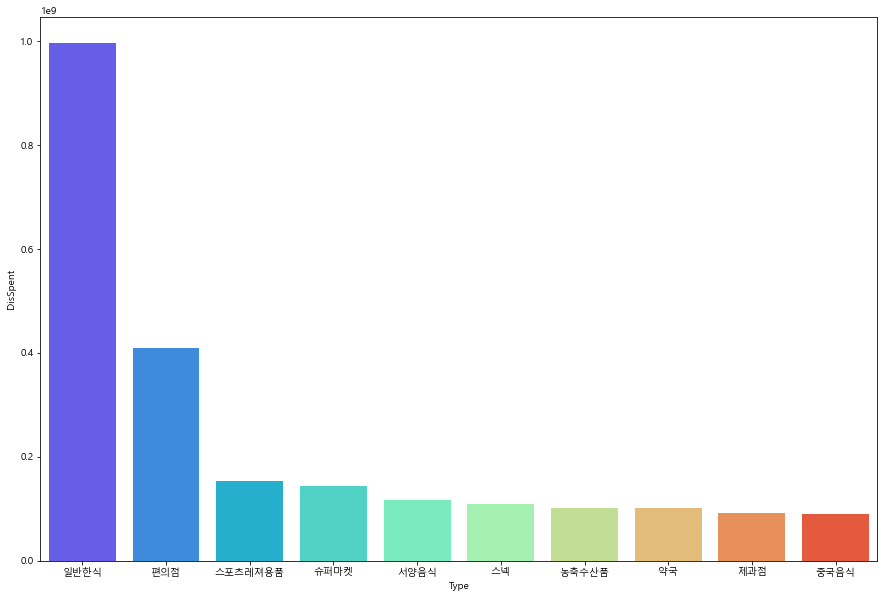

In [375]:
plt.figure(figsize=(15,10))
sns.barplot(y="DisSpent", x='Type', palette='rainbow'
            ,data=mid.groupby('Type').sum().DisSpent.to_frame().reset_index().sort_values(by='DisSpent',ascending=False)[:10])

In [376]:
mid1 = total[total['FranClass'] =='중소1']
mid1.head()

,YM,SIDO,SIGUNGU,FranClass,Type,Time,TotalSpent,DisSpent,NumofSpent,NumofDisSpent,lat,lng,per
2,202005,제주특별자치도,제주시,중소1,편의점,00시,157670,6850,20,2,33.303746,126.177311,0.043445
7,202005,제주특별자치도,제주시,중소1,편의점,00시,215910,34250,27,4,33.352476,126.180594,0.158631
10,202005,제주특별자치도,제주시,중소1,편의점,00시,20520,0,2,0,33.367590,126.196934,0.000000
14,202005,제주특별자치도,제주시,중소1,일반한식,00시,4487000,0,59,0,33.389179,126.224968,0.000000
17,202005,제주특별자치도,제주시,중소1,편의점,00시,237370,21020,22,2,33.389240,126.229266,0.088554


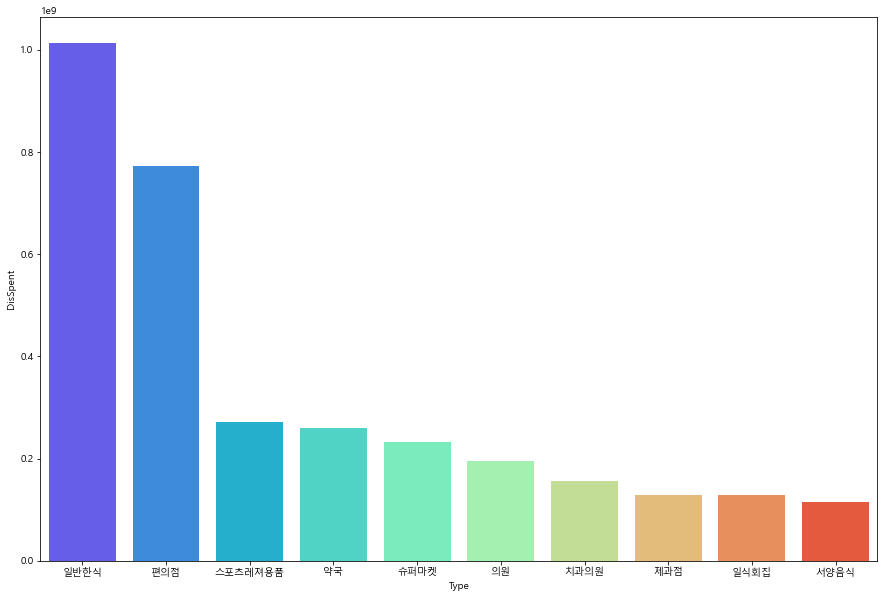

In [378]:
plt.figure(figsize=(15,10))
sns.barplot(y="DisSpent", x='Type', palette='rainbow'
            ,data=mid1.groupby('Type').sum().DisSpent.to_frame().reset_index().sort_values(by='DisSpent',ascending=False)[:10])

In [379]:
mid2 = total[total['FranClass'] =='중소2']
mid2.head()

,YM,SIDO,SIGUNGU,FranClass,Type,Time,TotalSpent,DisSpent,NumofSpent,NumofDisSpent,lat,lng,per
19,202005,제주특별자치도,제주시,중소2,편의점,00시,7000,0,2,0,33.394762,126.237214,0.000000
33,202005,제주특별자치도,제주시,중소2,편의점,00시,695390,92540,69,7,33.399780,126.241413,0.133076
64,202005,제주특별자치도,서귀포시,중소2,편의점,00시,443570,13500,48,2,33.224089,126.249221,0.030435
138,202005,제주특별자치도,제주시,중소2,편의점,00시,83770,0,6,0,33.418063,126.259321,0.000000
175,202005,제주특별자치도,제주시,중소2,슈퍼마켓,00시,49830,0,2,0,33.414496,126.262079,0.000000


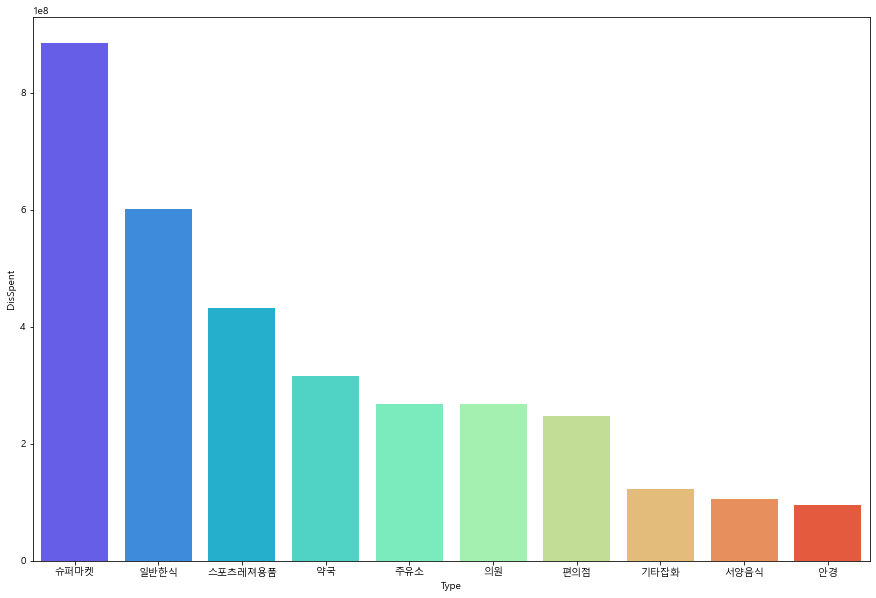

In [380]:
plt.figure(figsize=(15,10))
sns.barplot(y="DisSpent", x='Type', palette='rainbow'
            ,data=mid2.groupby('Type').sum().DisSpent.to_frame().reset_index().sort_values(by='DisSpent',ascending=False)[:10])

### 거의 식료품이나, 스포츠용품등 생활에서 사용되는 금액이 높음을 알 수 있다.

- 월별 재난지원금사용처 지도시각화

In [506]:
df1 = df1[df1['DisSpent']!=0]
df2 = df2[df2['DisSpent']!=0]
df3 = df3[df3['DisSpent']!=0]
df4 = df4[df4['DisSpent']!=0]

In [515]:
m = folium.Map(
    location=[33.41, 126.552],
    zoom_start=10
)
for i in df1.index:
    folium.Circle(
        location = df1.loc[i, ['lat', 'lng']],
        radius = 200,
        color='red'
    ).add_to(m)
for i in df2.index:
    folium.Circle(
        location = df2.loc[i, ['lat', 'lng']],
        radius = 200,
        color='blue'
    ).add_to(m)
for i in df3.index:
    folium.Circle(
        location = df3.loc[i, ['lat', 'lng']],
        radius = 200,
        color='green'
    ).add_to(m)
for i in df4.index:
    folium.Circle(
        location = df4.loc[i, ['lat', 'lng']],
        radius = 200,
        color='yellow'
    ).add_to(m)
m

### 결론: 재난지원금 전과 후의 사람들이 사용하는 카테고리 항목은 크게 차이가 없었다. 물론 면세점,백화점을 사용하지 못한것을 감안하더라도, 재난지원금은 음식에 많이쓰인 것으로 보인다.